In [ ]:
 pip install git+https://github.com/pytube/pytube

  Cloning https://github.com/pytube/pytube to /tmp/pip-req-build-ba8gp9q6
  Running command git clone --filter=blob:none --quiet https://github.com/pytube/pytube /tmp/pip-req-build-ba8gp9q6
  Resolved https://github.com/pytube/pytube to commit a32fff39058a6f7e5e59ecd06a7467b71197ce35
  Preparing metadata (setup.py) ... done
  Created wheel for pytube: filename=pytube-15.0.0-py3-none-any.whl size=57580 sha256=fc5e8c1daa04ac414fcd2a3e4bcfdc97c6eee453cf673b667053c578cf145fa3
  Stored in directory: /tmp/pip-ephem-wheel-cache-rz2_95w8/wheels/b0/a9/7d/d3579227a695fdd15288c35657b3332ef0d71430ca7f685769
Successfully built pytube


In [ ]:
import torch
import torchvision
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pytube import YouTube
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F


### Video Preprocessing

We now load the video and extract frames to process each frame using Faster-RCNN. We will use OpenCV to read the video file and extract individual frames.


In [ ]:
import ssl
from pytube import YouTube
from pytube import request
from pytube import extract
from pytube.innertube import _default_clients
from pytube.exceptions import RegexMatchError

_default_clients["ANDROID"]["context"]["client"]["clientVersion"] = "19.08.35"
_default_clients["IOS"]["context"]["client"]["clientVersion"] = "19.08.35"
_default_clients["ANDROID_EMBED"]["context"]["client"]["clientVersion"] = "19.08.35"
_default_clients["IOS_EMBED"]["context"]["client"]["clientVersion"] = "19.08.35"
_default_clients["IOS_MUSIC"]["context"]["client"]["clientVersion"] = "6.41"
_default_clients["ANDROID_MUSIC"] = _default_clients["ANDROID"]

import pytube, re
def patched_get_throttling_function_name(js: str) -> str:
    function_patterns = [
        r'a\.[a-zA-Z]\s*&&\s*\([a-z]\s*=\s*a\.get\("n"\)\)\s*&&.*?\|\|\s*([a-z]+)',
        r'\([a-z]\s*=\s*([a-zA-Z0-9$]+)(\[\d+\])?\([a-z]\)',
        r'\([a-z]\s*=\s*([a-zA-Z0-9$]+)(\[\d+\])\([a-z]\)',
    ]
    for pattern in function_patterns:
        regex = re.compile(pattern)
        function_match = regex.search(js)
        if function_match:
            if len(function_match.groups()) == 1:
                return function_match.group(1)
            idx = function_match.group(2)
            if idx:
                idx = idx.strip("[]")
                array = re.search(
                    r'var {nfunc}\s*=\s*(\[.+?\]);'.format(
                        nfunc=re.escape(function_match.group(1))),
                    js
                )
                if array:
                    array = array.group(1).strip("[]").split(",")
                    array = [x.strip() for x in array]
                    return array[int(idx)]

    raise RegexMatchError(
        caller="get_throttling_function_name", pattern="multiple"
    )

ssl._create_default_https_context = ssl._create_unverified_context
pytube.cipher.get_throttling_function_name = patched_get_throttling_function_name

# Load video from YouTube
yt = YouTube("https://www.youtube.com/watch?v=vUnuDTVHwGE&ab_channel=LearnOpenCV")
video_stream = yt.streams.filter(progressive=True, file_extension="mp4").first()
video_stream.download(output_path="./output")

video_path = "/content/output/Football match tracking output.mp4"  # Path to downloaded video
cap = cv2.VideoCapture(video_path)

# Read one frame to check if the video is loading
ret, frame = cap.read()
if not ret:
    print("Error loading video.")
else:
    print("Video loaded successfully!")
cap.release()


Video loaded successfully!


### Model Initialization

We will load the pre-trained **Faster-RCNN ResNet50** model from PyTorch's ,<b>torchvision.models.detection</b> module. This model is pre-trained on the COCO dataset and will be used for object detection.


In [ ]:
# Initialize the Faster R-CNN model with pre-trained weights
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT)

model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

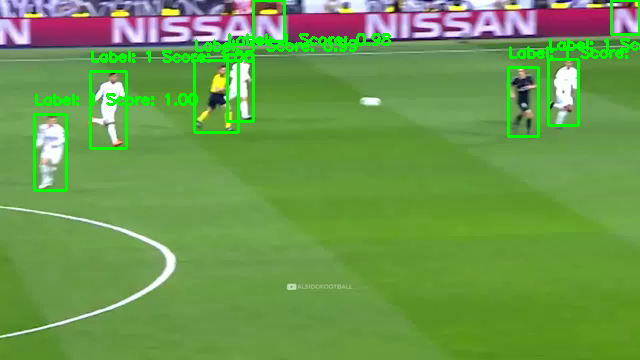

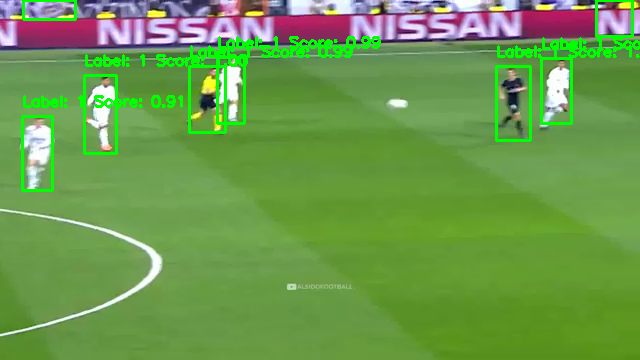

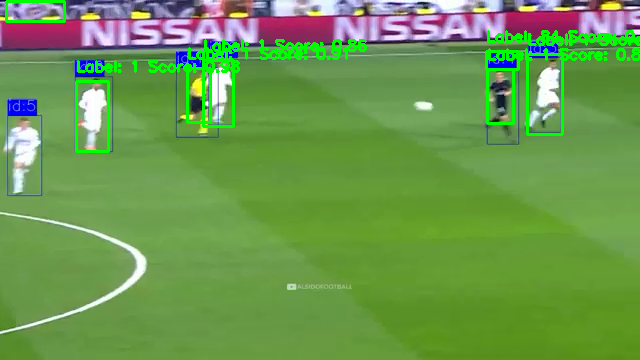

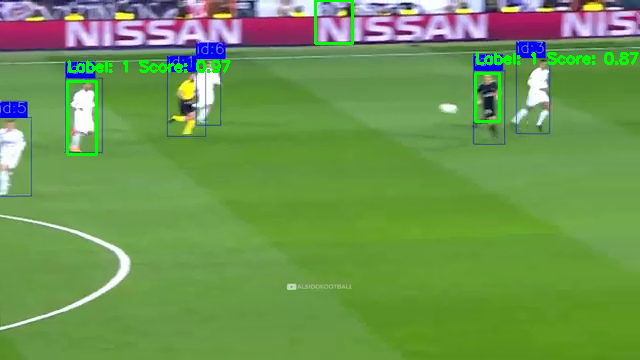

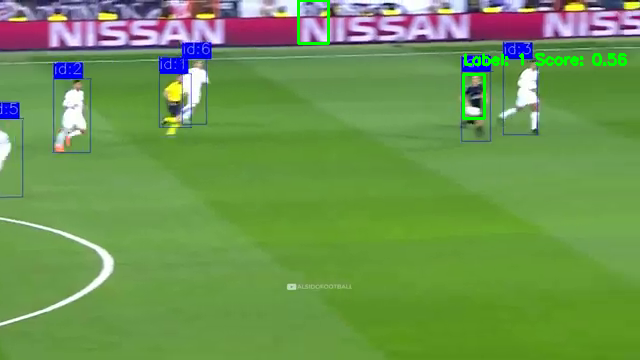

...

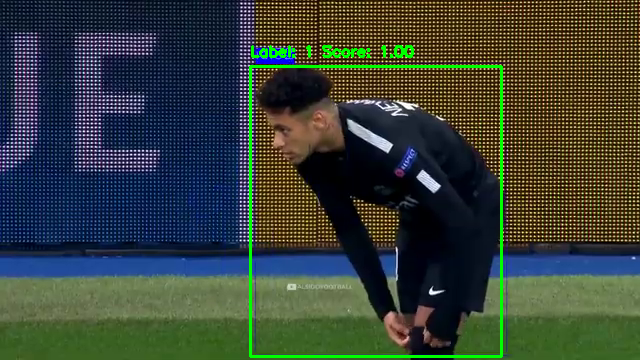

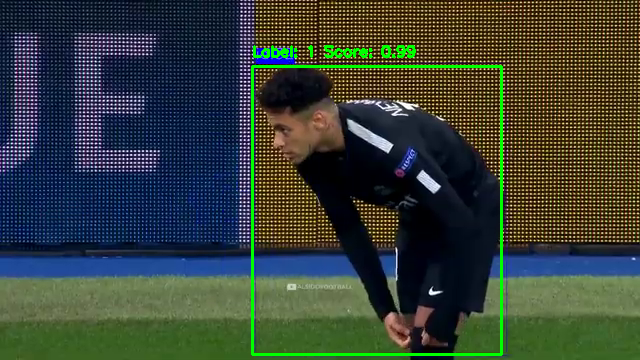

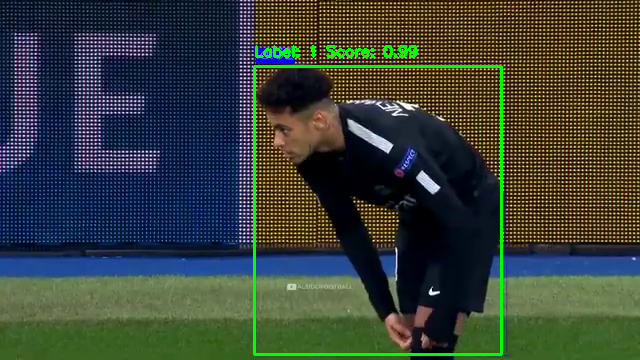

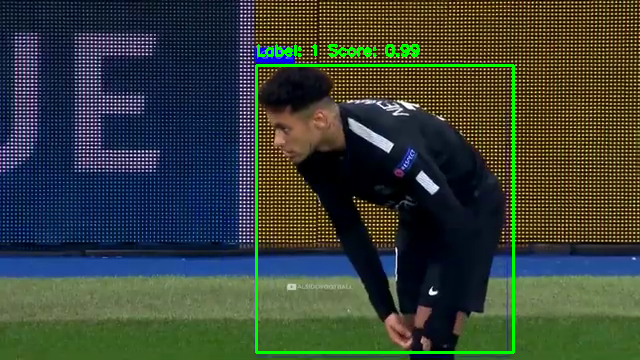

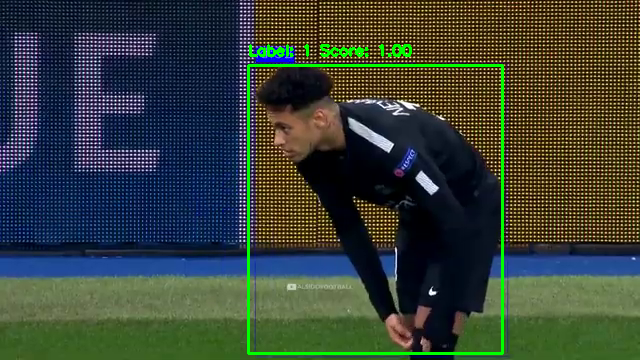

KeyboardInterrupt: 

In [24]:
from google.colab.patches import cv2_imshow

# Function to perform object detection on a single frame
def process_frame(frame):
    frame_tensor = F.to_tensor(frame).unsqueeze(0).to(device)
    with torch.no_grad():
        predictions = model(frame_tensor)

    return predictions
# Read and process frames from the video
cap = cv2.VideoCapture(video_path)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    predictions = process_frame(frame)

    # Visualization: Process the first image from the predictions
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()

    # Filter out predictions with low confidence
    threshold = 0.5
    for i in range(len(boxes)):
        if scores[i] > threshold:
            box = boxes[i]
            label = labels[i]
            score = scores[i]


            x1, y1, x2, y2 = box
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            cv2.putText(frame, f"Label: {label} Score: {score:.2f}", (int(x1), int(y1) - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    cv2_imshow(frame)
    # Stop if 'e' is pressed
    if cv2.waitKey(1) & 0xFF == ord('e'):
        break

cap.release()
cv2.destroyAllWindows()


### 5. Visualizing the Output

Here, we will visualize one of the processed frames to see how the Faster-RCNN model detects objects. We will show the bounding boxes, labels, and confidence scores.


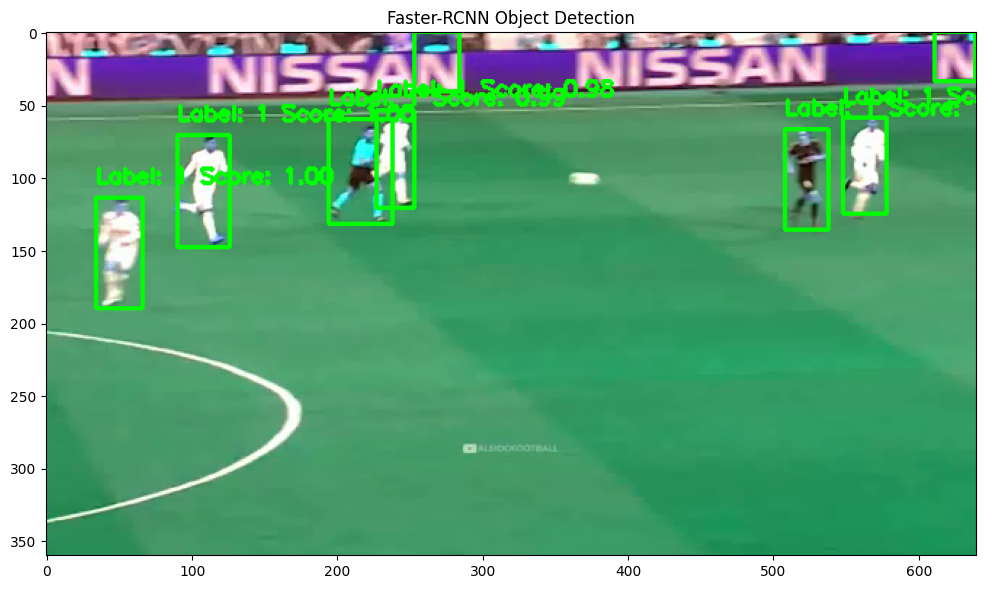

In [25]:
# Visualize one frame
def visualize_detections(frame, predictions):
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()

    # Filter out low-confidence predictions
    threshold = 0.5
    for i in range(len(boxes)):
        if scores[i] > threshold:
            box = boxes[i]
            label = labels[i]
            score = scores[i]


            x1, y1, x2, y2 = box
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            cv2.putText(frame, f"Label: {label} Score: {score:.2f}", (int(x1), int(y1) - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return frame

# Process and visualize the first frame
cap = cv2.VideoCapture(video_path)
ret, frame = cap.read()
cap.release()

predictions = process_frame(frame)
output_frame = visualize_detections(frame, predictions)
# Display the result
plt.figure(figsize=(12, 8))
plt.imshow(output_frame)
plt.title("Faster-RCNN Object Detection")
plt.show()


# **Final Output**:
     - The model outputs class labels, bounding boxes, and confidence scores  for each detected object.